# Predicting personal financial distress

## Context

### Introduction

Banks play a crucial role in market economies. They decide who can get finance and on what terms and can make or break investment decisions. For markets and society to function, individuals and companies need access to credit. 

Credit scoring algorithms, which make a guess at the probability of default, are the method banks use to determine whether or not a loan should be granted. 

We want to build a model that borrowers can use to help make the best financial decisions, by predicting the probability that somebody will experience financial distress in the next two years.

### Data explanation

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

The dataset obtained from https://www.kaggle.com/c/GiveMeSomeCredit contains 11 fields for 150,000 people. 

SeriousDlqin2yrs: Person experienced 90 days past due delinquency or worse

RevolvingUtilizationOfUnsecuredLines: Total balance on credit cards and personal lines of credit except real estate and no installment debt like car loans divided by the sum of credit limits

age: Age of borrower in years

NumberOfTime30-59DaysPastDueNotWorse: Number of times borrower has been 30-59 days past due but no worse in the last 2 years.

DebtRatio: Monthly debt payments, alimony,living costs divided by monthy gross income

MonthlyIncome: Monthly income

NumberOfOpenCreditLinesAndLoans: Number of Open loans (installment like car loan or mortgage) and Lines of credit (e.g. credit cards)

NumberOfTimes90DaysLate: Number of times borrower has been 90 days or more past due.

NumberRealEstateLoansOrLines: Number of mortgage and real estate loans including home equity lines of credit

NumberRealEstateLoansOrLines: Number of mortgage and real estate loans including home equity lines of credit

NumberOfTime60-89DaysPastDueNotWorse: Number of times borrower has been 60-89 days past due but no worse in the last 2 years.

NumberOfDependents: Number of dependents in family excluding themselves (spouse, children etc.)

We would construct several classification models, trying to predict whether a person would experience 90 days past due delinquency or worse.

### Explore data

In [2]:
credit = pd.read_csv("cs-training.csv")
credit.head(20)

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
5,6,0,0.213179,74,0,0.375607,3500.0,3,0,1,0,1.0
6,7,0,0.305682,57,0,5710.000000,NaN,8,0,3,0,0.0
7,8,0,0.754464,39,0,0.209940,3500.0,8,0,0,0,0.0
8,9,0,0.116951,27,0,46.000000,NaN,2,0,0,0,NaN
9,10,0,0.189169,57,0,0.606291,23684.0,9,0,4,0,2.0


In [3]:
# We drop the index column
credit = credit.drop(credit.columns[0], axis=1)

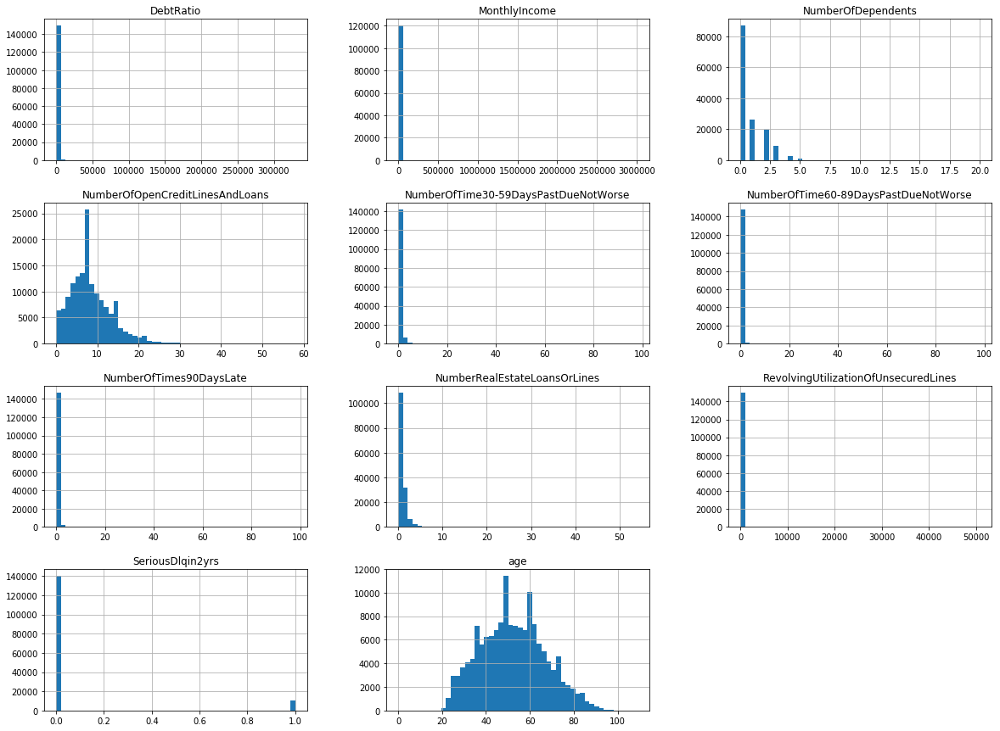

In [4]:
credit.hist(bins=50, figsize=(20, 15))
plt.show()

Many histogram are heavily skewed, which may make it hard for some Machine Learning algorithms to detect patterns. We will try transforming these attributes to have more bell-shaped distributions.

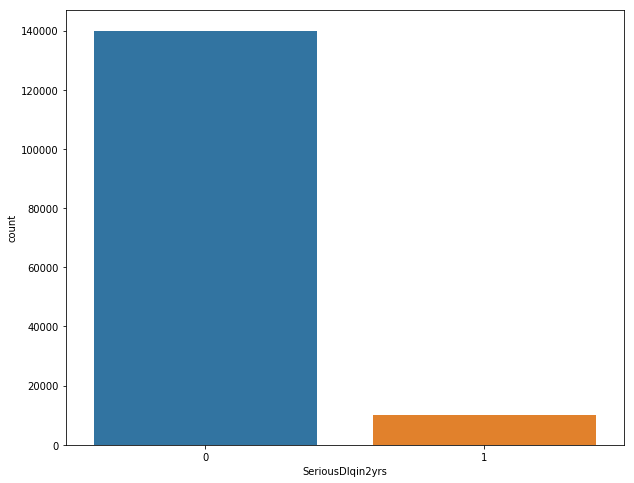

In [5]:
plt.figure(figsize=(10,8))
sns.countplot("SeriousDlqin2yrs", data=credit)


Moreover, the response value SeriousDlqin2yrs is heavily skewed right, meaning that the class instances are imbalanced. We need to keep this in mind when training and evaluating our model.

In [6]:
credit.describe()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


The min of age is 0 and since age < 16 does not make sense, we'll need to explore and clean up the value.

In [7]:
# Count the number of people with age < 16 
credit[credit['age'] < 16].count()

SeriousDlqin2yrs                        1
RevolvingUtilizationOfUnsecuredLines    1
age                                     1
NumberOfTime30-59DaysPastDueNotWorse    1
DebtRatio                               1
MonthlyIncome                           1
NumberOfOpenCreditLinesAndLoans         1
NumberOfTimes90DaysLate                 1
NumberRealEstateLoansOrLines            1
NumberOfTime60-89DaysPastDueNotWorse    1
NumberOfDependents                      1
dtype: int64

In [8]:
# We drop the one observation where age < 16
credit = credit[credit['age'] > 15]

In [9]:
# Check for missing values
credit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 149999 entries, 0 to 149999
Data columns (total 11 columns):
SeriousDlqin2yrs                        149999 non-null int64
RevolvingUtilizationOfUnsecuredLines    149999 non-null float64
age                                     149999 non-null int64
NumberOfTime30-59DaysPastDueNotWorse    149999 non-null int64
DebtRatio                               149999 non-null float64
MonthlyIncome                           120268 non-null float64
NumberOfOpenCreditLinesAndLoans         149999 non-null int64
NumberOfTimes90DaysLate                 149999 non-null int64
NumberRealEstateLoansOrLines            149999 non-null int64
NumberOfTime60-89DaysPastDueNotWorse    149999 non-null int64
NumberOfDependents                      146075 non-null float64
dtypes: float64(4), int64(7)
memory usage: 13.7 MB


We have missing values for MonthlyIncome and NumberOfDependents, and we would fill the missing values with median value. We also want to apply feature scaling to our data to aid Machine Learning algorithms. 

In [10]:
credit_labels = credit.columns
credit_labels

Index(['SeriousDlqin2yrs', 'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

In [11]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin

# Variables that need to be log-transformed
utilization_ix, pastDue_30_59_ix, debt_ix, income_ix = 1, 3, 4, 5
creditLinesLoans_ix, pastDue_90_ix, estateLoansLines, pastDue_60_89_ix, dependent_ix  = 6, 7, 8, 9, 10
    
class LogTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        X[:, utilization_ix] = np.log(X[:, utilization_ix] + 1)
        X[:, pastDue_30_59_ix] = np.log(X[:, pastDue_30_59_ix] + 1)
        X[:, debt_ix] = np.log(X[:, debt_ix] + 1)
        X[:, income_ix] = np.log(X[:, income_ix] + 1)
        X[:, creditLinesLoans_ix] = np.log(X[:, creditLinesLoans_ix] + 1)
        X[:, pastDue_90_ix] = np.log(X[:, pastDue_90_ix] + 1)
        X[:, estateLoansLines] = np.log(X[:, estateLoansLines] + 1)
        X[:, pastDue_60_89_ix] = np.log(X[:, pastDue_60_89_ix] + 1)
        X[:, dependent_ix] = np.log(X[:, dependent_ix] + 1)
        return X

# Make a copy of responses values as we don't want to modify it
responses = credit['SeriousDlqin2yrs']

# Pipeline with median imputer, nad 
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="median")),
    ('log_transformer', LogTransformer()),
#     ('std_scaler', StandardScaler()),
])

prepared = pipeline.fit_transform(credit)

# Re-assemble the data frame 
credit = pd.DataFrame(
    data=prepared,
    columns=credit_labels,
)
# credit['SeriousDlqin2yrs'] = responses

credit.head(20)

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1.0,0.568789,45.0,1.098612,0.589442,9.118335,2.639057,0.000000,1.945910,0.000000,1.098612
1,0.0,0.671490,40.0,0.000000,0.115002,7.863651,1.609438,0.000000,0.000000,0.000000,0.693147
2,0.0,0.505721,38.0,0.693147,0.081684,8.020599,1.098612,0.693147,0.000000,0.000000,0.000000
3,0.0,0.210107,30.0,0.000000,0.035415,8.101981,1.791759,0.000000,0.000000,0.000000,0.000000
4,0.0,0.645657,49.0,0.693147,0.024620,11.060196,2.079442,0.000000,0.693147,0.000000,0.000000
5,0.0,0.193244,74.0,0.000000,0.318895,8.160804,1.386294,0.000000,0.693147,0.000000,0.693147
6,0.0,0.266726,57.0,0.000000,8.650149,8.594339,2.197225,0.000000,1.386294,0.000000,0.000000
7,0.0,0.562163,39.0,0.000000,0.190571,8.160804,2.197225,0.000000,0.000000,0.000000,0.000000
8,0.0,0.110602,27.0,0.000000,3.850148,8.594339,1.098612,0.000000,0.000000,0.000000,0.000000
9,0.0,0.173255,57.0,0.000000,0.473928,10.072597,2.302585,0.000000,1.609438,0.000000,1.098612


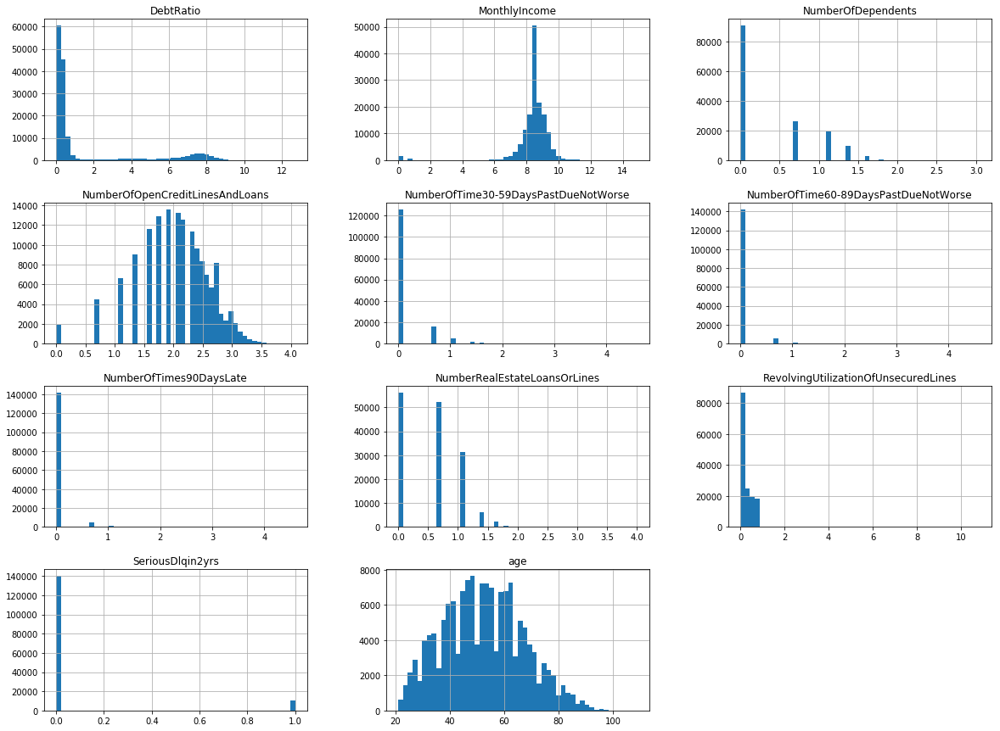

In [12]:
credit.hist(bins=50, figsize=(20, 15))
plt.show()

In [13]:
credit.describe()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,149999.000000,149999.000000,149999.000000,149999.000000,149999.000000,149999.000000,149999.000000,149999.000000,149999.000000,149999.000000,149999.000000
mean,0.066840,0.257897,52.295555,0.147559,1.525182,8.447403,2.088509,0.057280,0.573834,0.047777,0.395145
std,0.249746,0.384852,14.771298,0.392144,2.627244,1.195800,0.598531,0.292856,0.499778,0.265236,0.528036
min,0.000000,0.000000,21.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029430,41.000000,0.000000,0.161331,8.269757,1.791759,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.143386,52.000000,0.000000,0.312255,8.594339,2.197225,0.000000,0.693147,0.000000,0.000000
75%,0.000000,0.444073,63.000000,0.000000,0.625006,8.909370,2.484907,0.000000,1.098612,0.000000,0.693147
max,1.000000,10.833859,109.000000,4.595120,12.705832,14.917036,4.077537,4.595120,4.007333,4.595120,3.044522


In [14]:
corr_matrix = credit.corr()
corr_matrix["SeriousDlqin2yrs"].sort_values(ascending=False)

SeriousDlqin2yrs                        1.000000
NumberOfTimes90DaysLate                 0.312581
NumberOfTime30-59DaysPastDueNotWorse    0.278642
NumberOfTime60-89DaysPastDueNotWorse    0.249055
RevolvingUtilizationOfUnsecuredLines    0.178770
NumberOfDependents                      0.047590
DebtRatio                              -0.017195
MonthlyIncome                          -0.017617
NumberRealEstateLoansOrLines           -0.029566
NumberOfOpenCreditLinesAndLoans        -0.062752
age                                    -0.115397
Name: SeriousDlqin2yrs, dtype: float64

# Predicting personal financial distress

### Prepare train and test set

In [15]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(credit, test_size=0.2, random_state=42)

X_train = train_set.drop('SeriousDlqin2yrs', axis=1)
Y_train = train_set['SeriousDlqin2yrs']

X_test = test_set.drop('SeriousDlqin2yrs', axis=1)
Y_test = test_set['SeriousDlqin2yrs']

X = credit.drop('SeriousDlqin2yrs', axis=1)
Y = credit['SeriousDlqin2yrs']

### Stochastic Gradient Descent (SGD) Model

In [16]:
from sklearn.linear_model import SGDClassifier
sgd = SGDClassifier(max_iter=500, tol=0.001, random_state=22)

# Train the model using the train set
sgd.fit(X_train, Y_train)
sgd.intercept_, sgd.coef_

(array([-0.8938122]),
 array([[ 0.2632556 , -0.03992858,  0.61029574,  0.0192522 ,  0.00781226,
          0.01015709,  1.25939733,  0.06054958,  0.60007748,  0.07210785]]))

To evaluate our SGD classifier, we compute the accuracy score, the confusion matrix, perform a cross validation with 5 folds, plot the Receiver Operating Characteristic (ROC) curve, and compute the area under the curve.

In [17]:
# Predict the train set 
Y_train_pred = sgd.predict(X_train)

# Compute accuracy score
from sklearn.metrics import accuracy_score
accuracy_score(Y_train, Y_train_pred)

0.9356827973566446

In [18]:
# Perform cross validation and compute accuracy score
from sklearn.model_selection import cross_val_score
cross_val_score(sgd, X, Y, cv=5)

array([0.93580214, 0.93313333, 0.93453333, 0.93666456, 0.93493116])

In [19]:
# Confusion matrix with cross valiation
from sklearn.model_selection import cross_val_predict

Y_train_cv_pred = cross_val_predict(sgd, X_train, Y_train, cv=5)
pd.crosstab(Y_train, Y_train_cv_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0.0,1.0,All
True,,,
0.0,110901,1031,111932
1.0,6894,1173,8067
All,117795,2204,119999


In [20]:
from sklearn.metrics import classification_report
print(classification_report(Y_train,Y_train_cv_pred))

              precision    recall  f1-score   support

         0.0       0.94      0.99      0.97    111932
         1.0       0.53      0.15      0.23      8067

   micro avg       0.93      0.93      0.93    119999
   macro avg       0.74      0.57      0.60    119999
weighted avg       0.91      0.93      0.92    119999



In [21]:
# Compute false positive rate, true positive rate, and thresholds
from sklearn.metrics import roc_curve

Y_pred_proba = cross_val_predict(sgd, X_train, Y_train, cv=5, method="decision_function")
fpr_sgd, tpr_sgd, thresholds_sgd = roc_curve(Y_train, Y_pred_proba)

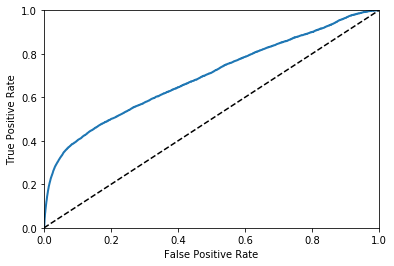

In [22]:
def plot_roc_curve(fpr, tpr, label=None):
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
plot_roc_curve(fpr_sgd, tpr_sgd)
plt.show()

In [23]:
# Compute area under ROC curve
from sklearn.metrics import roc_auc_score
roc_auc_score(Y_train, Y_pred_proba)

0.6946577704004628

Notice that even though the accuracy score is high (~90%), the area under the ROC curve is only about 0.57. 

Since our dataset only has about 10% instances of response 1 (people will face financial distress in the next two years), ROC is a more reliable evaluation. In this case, it tells us that our model does not work well in seperating the two classes, and the 90% accuracy is likely coming from the skewed data and our model's tendency to classify people into class 1.

Thus, we will only use ROC curve and the area under the curve as model evaluation for this dataset.

We plot ROC curve with cross validation and compute the area under the curve to see how well the model generalizes to unseen data.

In [24]:
import matplotlib.pylab as plb
import matplotlib.patches as patches
from scipy import interp
from sklearn.metrics import roc_curve, auc

def plot_roc_cv(tprs, aucs, mean_fpr):
    plb.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
         label='Chance', alpha=.8)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    plb.plot(mean_fpr, mean_tpr, color='b',
             label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
             lw=2, alpha=.8)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    plb.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                     label=r'$\pm$ 1 std. dev.')

    plb.xlim([-0.05, 1.05])
    plb.ylim([-0.05, 1.05])
    plb.xlabel('False Positive Rate')
    plb.ylabel('True Positive Rate')
    plb.title('Receiver operating characteristic with cross validation')
    plb.legend(loc="lower right")

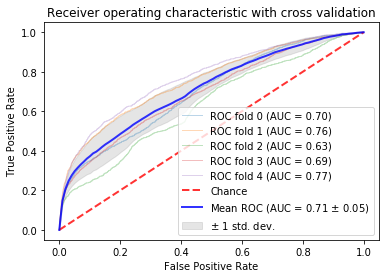

In [25]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)
skf.get_n_splits(X_train)

tprs = []
aucs = []

mean_fpr_sgd = np.linspace(0, 1, 100)

i = 0

for train_index, test_index in skf.split(X_train, Y_train):
    x_train, x_test = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train, y_test = Y_train.iloc[train_index], Y_train.iloc[test_index]
    
    sgd.fit(x_train, y_train)
    
    # Compute ROC curve and area the curve
    Y_pred_proba = cross_val_predict(sgd, x_test, y_test, cv=5, method="decision_function")
    fpr, tpr, thresholds = roc_curve(y_test, Y_pred_proba)
    
    tprs.append(interp(mean_fpr_sgd, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plb.plot(fpr, tpr, lw=1, alpha=0.3,
             label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
    i += 1

plot_roc_cv(tprs, aucs, mean_fpr_sgd)
plb.show()

A purely random classifier will have an area under the curve ROC of 0.5 so we exclude SGD classifier for this data set. 

### K-Nearest Neighbors (KNN) Model 

In [26]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)

# Train the model using the train set
knn.fit(X_train, Y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform')

To evaluate our KNN classifier, we plot the ROC curve and compute the area under the curve.

In [27]:
# Compute false positive rate, true positive rate, and thresholds
Y_pred_proba = knn.predict_proba(X_train)[:,1]
fpr_knn, tpr_knn, thresholds_knn = roc_curve(Y_train, Y_pred_proba)

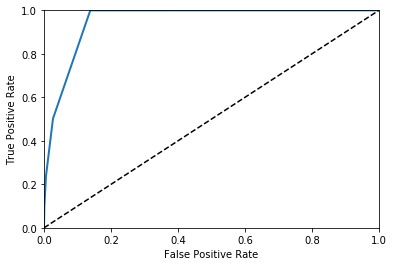

In [28]:
plot_roc_curve(fpr_knn, tpr_knn)
plt.show()

In [29]:
# Compute area under ROC curve
roc_auc_score(Y_train, Y_pred_proba)

0.9541909024693803

Even though the ROC curve looks good in this case, we want to plot ROC curve with 5 folds cross validation and compute the area under the curve to see how well the model generalizes to unseen data.

In [30]:
# Plot ROC curve for model that has predict_proba function with k stratified folds
def plot_roc_cv_has_prob(model, X, Y, k):
    
    skf = StratifiedKFold(n_splits=k, random_state=None, shuffle=False)
    skf.get_n_splits(X)
    
    tprs = []
    aucs = []

    mean_fpr = np.linspace(0, 1, 100)
    mean_tpr = np.linspace(0, 1, 100)

    i = 0

    for train_index, test_index in skf.split(X_train, Y_train):
        x_train, x_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = Y.iloc[train_index], Y.iloc[test_index]

        model.fit(x_train, y_train)

        # Compute ROC curve and area the curve
        Y_pred_proba = model.predict_proba(x_test)[:,1]
        fpr, tpr, thresholds = roc_curve(y_test, Y_pred_proba)

        tprs.append(interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        plb.plot(fpr, tpr, lw=1, alpha=0.3,
                 label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
        
        mean_tpr = np.mean(tprs, axis=0)
        i += 1

    plot_roc_cv(tprs, aucs, mean_fpr)
    
    return (mean_fpr, mean_tpr)

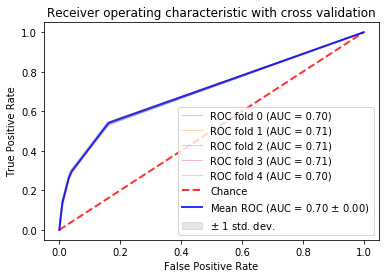

In [31]:
plot_roc_cv_has_prob(knn, X_train, Y_train, 5)
plb.show()

The area under the ROC curve only 0.67 and we can improve this with hyperparameter tuning.

Hyperparameter tuning with Grid Search:

1) Trying a bunch of different hyperparameter values

2) Fitting all of them separately

3) Checking how well each performs

4) Choosing the best performing one

5) Using cross-validation every time

Note that since the tuning process is computationally expansive so we want to run it once and save the best hyperparameters.

In [32]:
from sklearn.model_selection import GridSearchCV

# The parameter to be tuned in KNN Classifier is n_neighbors
param_grid = {'n_neighbors':np.arange(1, 50)}

In [33]:
knn = KNeighborsClassifier()
knn_gs = GridSearchCV(knn, param_grid, cv=5, n_jobs=-1, error_score='f1')
knn_gs.fit(X_train, Y_train)

GridSearchCV(cv=5, error_score='f1',
       estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=5, p=2,
           weights='uniform'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [34]:
knn_gs.best_score_

0.9348827906899224

In [35]:
knn_gs.best_params_

{'n_neighbors': 21}

In [36]:
knn_tuned = KNeighborsClassifier(n_neighbors=21)

We plot ROC curve with 5 folds cross validation and compute the area under the curve to see how well the model generalizes to unseen data.

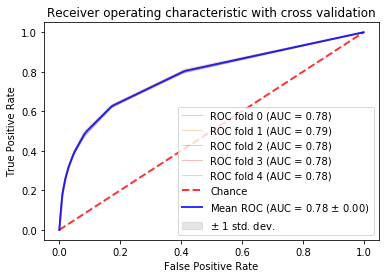

In [37]:
mean_fpr_knn, mean_tpr_knn = plot_roc_cv_has_prob(knn_tuned, X_train, Y_train, 5)
plb.show()

The mean area under the ROC curve improves from 0.67 to 0.74. This gives us the evidence that the tuned KNN model has better performance than the untuned KNN model and the SGD model. 

### Decision Tree (DT) Model 

In [38]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=0)

# Train the model using the train set
dt.fit(X_train, Y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

In [39]:
# Compute false positive rate, true positive rate, and thresholds
Y_pred_proba = dt.predict_proba(X_train)[:,1]
fpr_dt, tpr_dt, thresholds_dt = roc_curve(Y_train, Y_pred_proba)

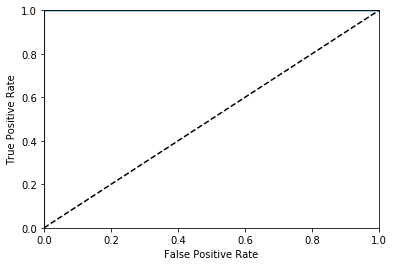

In [40]:
plot_roc_curve(fpr_dt, tpr_dt)
plt.show()

In [41]:
# Compute area under ROC curve
roc_auc_score(Y_train, Y_pred_proba)

0.9999986018136239

The nearly perfect score raises the concern of overfitting. We plot ROC curve with 5 folds cross validation and compute the area under the curve to see how well the model generalizes to unseen data.

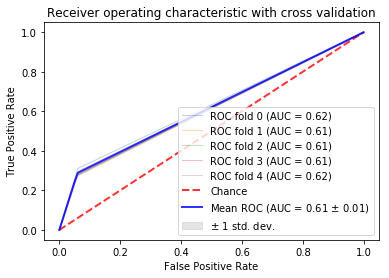

In [42]:
plot_roc_cv_has_prob(dt, X_train, Y_train, 5)
plb.show()

This provides evidence of overfitting and we need to improve our model by tuning its hyperparamter.

In [43]:
param_grid = {"max_depth": [3, 5, 8, 10, 12, 15, 18, 20],
              "max_features": [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              "min_samples_split": [2, 3, 4, 5, 6, 7, 8, 9, 10],
              "min_samples_leaf": [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
             }

In [44]:
dt = DecisionTreeClassifier()
dt_gs = GridSearchCV(dt, param_grid, cv=5, n_jobs=-1, error_score='f1')
dt_gs.fit(X_train, Y_train)

GridSearchCV(cv=5, error_score='f1',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [3, 5, 8, 10, 12, 15, 18, 20], 'max_features': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10], 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [45]:
dt_gs.best_score_

0.9365828048567071

In [46]:
dt_gs.best_params_

{'max_depth': 5,
 'max_features': 6,
 'min_samples_leaf': 9,
 'min_samples_split': 2}

In [47]:
dt_tuned = DecisionTreeClassifier(max_depth=5, max_features=6, min_samples_leaf=9, min_samples_split=2)

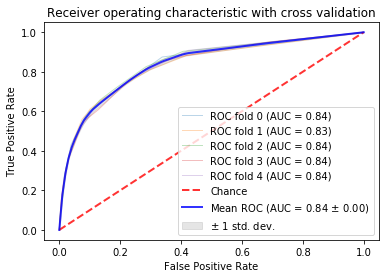

In [48]:
mean_fpr_dt, mean_tpr_dt = plot_roc_cv_has_prob(dt_tuned, X_train, Y_train, 5)
plb.show()

The mean area under the ROC curve improves to 0.84 and decision tree is the best model so far. 

We also want to plot the importance of each feature to better understand what matters the most in predicting whether a person will face financial distress within 2 years in our decision tree model.

In [49]:
def plot_feature_importances(model):
    plt.figure(figsize=(10,8))
    n_features = X.shape[1]
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), X.columns)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)

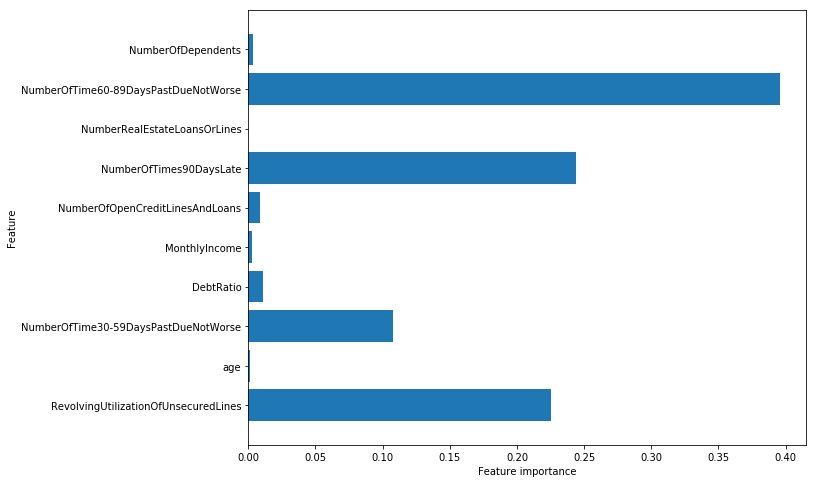

In [50]:
plot_feature_importances(dt_tuned)

In [51]:
from sklearn.tree import export_graphviz

dt_tuned.fit(X_train, Y_train)

export_graphviz(
    dt_tuned,
    out_file="credit_tree.dot",
    feature_names=list(X),
    rounded=True,
    filled=True
)

# Convert to png using system command
from subprocess import call
call(['dot', '-Tpng', 'credit_tree.dot', '-o', 'credit_tree.png', '-Gdpi=600'])

0

In [52]:
# Display tree
from IPython.display import Image
Image(filename = 'credit_tree.png')

### Random Forest (RF) Model

In [53]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

In [54]:
param_dist = {"n_estimators": [10, 50, 100, 200, 300, 400, 500, 600, 700],
              "max_depth": [3, 5, 7, 9, 11, 13],
              "max_features": sp_randint(1, 10),
              "min_samples_split": sp_randint(2, 11),
              "min_samples_leaf": sp_randint(1, 11),
              "max_leaf_nodes": sp_randint(5, 25),
              "bootstrap": [True, False]
             }

In [55]:
rf = RandomForestClassifier()
rf_gs = RandomizedSearchCV(rf, param_distributions=param_dist, cv=5, n_jobs=-1, error_score='f1', n_iter=50)
rf_gs.fit(X_train, Y_train)

RandomizedSearchCV(cv=5, error_score='f1',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          fit_params=None, iid='warn', n_iter=50, n_jobs=-1,
          param_distributions={'n_estimators': [10, 50, 100, 200, 300, 400, 500, 600, 700], 'max_depth': [3, 5, 7, 9, 11, 13], 'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x1a18827860>, 'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x1a18827908>, 'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x1a18827160>, 'max_leaf_nodes': <scipy.stats._distn_infrastructure.

In [56]:
rf_gs.best_params_

{'bootstrap': True,
 'max_depth': 9,
 'max_features': 5,
 'max_leaf_nodes': 24,
 'min_samples_leaf': 5,
 'min_samples_split': 2,
 'n_estimators': 300}

In [57]:
rf_tuned = RandomForestClassifier(
    bootstrap=True, max_depth=9, max_features=5, 
    max_leaf_nodes=24, min_samples_leaf=5, 
    min_samples_split=2, n_estimators=300)

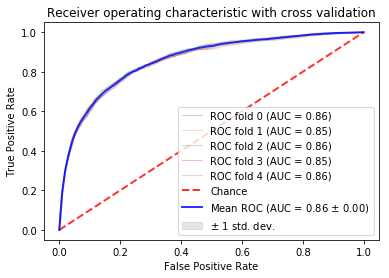

In [58]:
mean_fpr_rf, mean_tpr_rf = plot_roc_cv_has_prob(rf_tuned, X_train, Y_train, 5)
plb.show()

The mean area under the ROC curve improves to 0.86, comparatively similar to the performance of decision tree.

We also want to plot the importance of each feature to better understand what matters the most in predicting whether a person will face financial distress within 2 years in our random forest model.

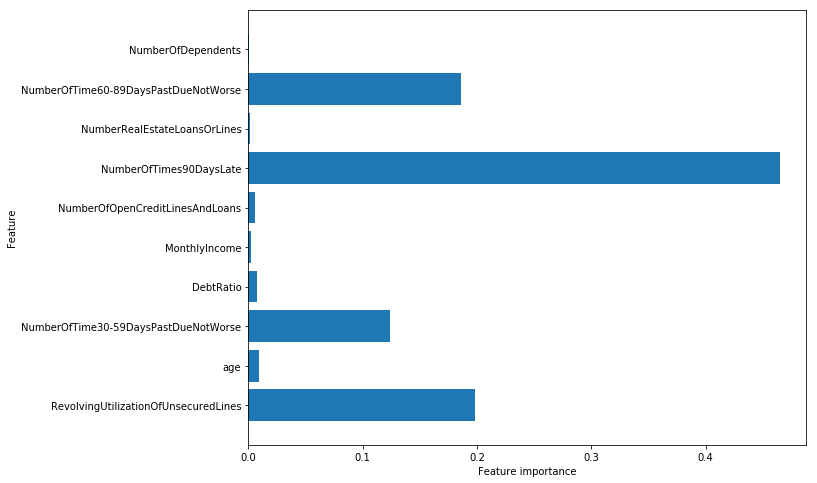

In [59]:
plot_feature_importances(rf_tuned)

### Voting Classifier

In [60]:
from sklearn.ensemble import VotingClassifier
voting = VotingClassifier(
    estimators=[("knn", knn_tuned), ("dt", dt_tuned), ("rf", rf_tuned)],
    voting="soft",
    n_jobs=-1
)

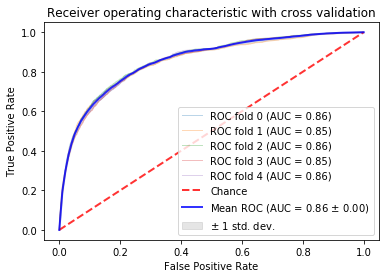

In [61]:
mean_fpr_v, mean_tpr_v = plot_roc_cv_has_prob(voting, X_train, Y_train, 5)
plb.show()

### Model comparison

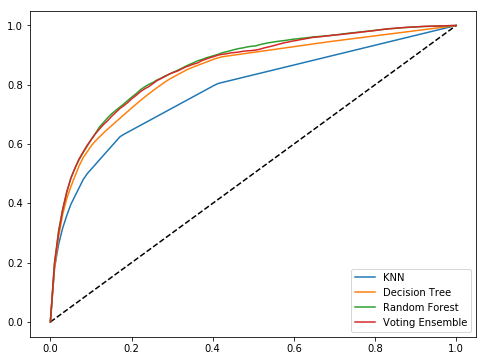

In [62]:
plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], 'k--')

plt.plot(mean_fpr_knn, mean_tpr_knn, label="KNN")
plt.plot(mean_fpr_dt, mean_tpr_dt, label="Decision Tree")
plt.plot(mean_fpr_rf, mean_tpr_rf, label="Random Forest")
plt.plot(mean_fpr_v, mean_tpr_v, label="Voting Ensemble")

plt.legend(loc="lower right")

plt.show()

### Performance on Test set

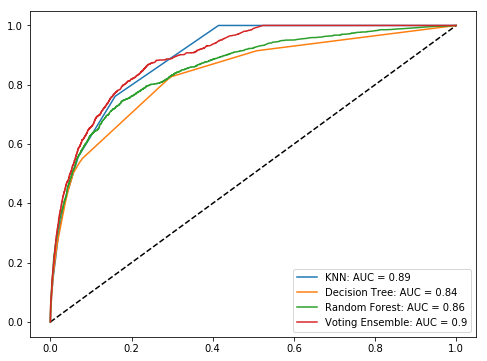

In [63]:
def plot_roc_auc(model, X, Y, name):
    model.fit(X, Y)
    Y_pred_proba = model.predict_proba(X)[:,1]
    fpr, tpr, thresholds = roc_curve(Y, Y_pred_proba)
    roc_auc = np.around(auc(fpr, tpr), decimals=2)
    plt.plot(fpr, tpr, label=name + ": AUC = " + str(roc_auc))
                 
plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], 'k--')
                                     
plot_roc_auc(knn_tuned, X_test, Y_test, "KNN")
plot_roc_auc(dt_tuned, X_test, Y_test, "Decision Tree")
plot_roc_auc(rf_tuned, X_test, Y_test, "Random Forest")
plot_roc_auc(voting, X_test, Y_test, "Voting Ensemble")
                                     
plt.legend(loc="lower right")

plt.show()

The voting classifier produces the best result on the test data and we choose it as our final model.